<a href="https://colab.research.google.com/github/Minhvt34/Forced_Alignment_Pytorch/blob/main/Lyric_Alignment_Zalo_Challenge_JaVteam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Vietnamese end-to-end speech recognition using wav2vec 2.0

In [ ]:
!pip3 install transformers==4.9.2 soundfile datasets==1.11.0 pyctcdecode==v0.1.0
!pip3 install https://github.com/kpu/kenlm/archive/master.zip

In [ ]:
!pip install gradio

## Load wav2vec model and tokenizer

In [3]:
import gradio as gr
import nltk
import librosa
from transformers import pipeline
from transformers.file_utils import cached_path, hf_bucket_url
import os, zipfile
from transformers import Wav2Vec2Processor, Wav2Vec2ForCTC, Wav2Vec2Tokenizer
from datasets import load_dataset
import torch
import kenlm
import torchaudio
from pyctcdecode import Alphabet, BeamSearchDecoderCTC, LanguageModel

"""Vietnamese speech2text"""
cache_dir = './cache/'
processor = Wav2Vec2Processor.from_pretrained("nguyenvulebinh/wav2vec2-base-vietnamese-250h", cache_dir=cache_dir)
vi_model = Wav2Vec2ForCTC.from_pretrained("nguyenvulebinh/wav2vec2-base-vietnamese-250h", cache_dir=cache_dir)
lm_file = hf_bucket_url("nguyenvulebinh/wav2vec2-base-vietnamese-250h", filename='vi_lm_4grams.bin.zip')
lm_file = cached_path(lm_file,cache_dir=cache_dir)
with zipfile.ZipFile(lm_file, 'r') as zip_ref:
    zip_ref.extractall(cache_dir)
lm_file = cache_dir + 'vi_lm_4grams.bin'

def get_decoder_ngram_model(tokenizer, ngram_lm_path):
    vocab_dict = tokenizer.get_vocab()
    sort_vocab = sorted((value, key) for (key, value) in vocab_dict.items())
    vocab = [x[1] for x in sort_vocab][:-2]
    vocab_list = vocab
    # convert ctc blank character representation
    vocab_list[tokenizer.pad_token_id] = ""
    # replace special characters
    vocab_list[tokenizer.unk_token_id] = ""
    # vocab_list[tokenizer.bos_token_id] = ""
    # vocab_list[tokenizer.eos_token_id] = ""
    # convert space character representation
    vocab_list[tokenizer.word_delimiter_token_id] = " "
    # specify ctc blank char index, since conventially it is the last entry of the logit matrix
    alphabet = Alphabet.build_alphabet(vocab_list, ctc_token_idx=tokenizer.pad_token_id)
    lm_model = kenlm.Model(ngram_lm_path)
    decoder = BeamSearchDecoderCTC(alphabet,
                                   language_model=LanguageModel(lm_model))
    return decoder
ngram_lm_model = get_decoder_ngram_model(processor.tokenizer, lm_file)

# define function to read in sound file
def speech_file_to_array_fn(path, max_seconds=10):
    batch = {"file": path}
    speech_array, sampling_rate = torchaudio.load(batch["file"])
    if sampling_rate != 16000:
      transform = torchaudio.transforms.Resample(orig_freq=sampling_rate,
                                                 new_freq=16000)
      speech_array = transform(speech_array)
    speech_array = speech_array[0]
    if max_seconds > 0:
      speech_array = speech_array[:max_seconds*16000]
    batch["speech"] = speech_array.numpy()
    batch["sampling_rate"] = 16000
    return batch

Downloading:   0%|          | 0.00/215 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.11k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/181 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Downloading:   0%|          | 0.00/1.65k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/378M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/904M [00:00<?, ?B/s]

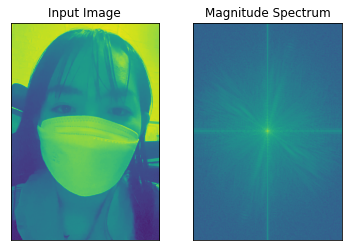

In [9]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
img = cv.imread('real.png',0)
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20*np.log(np.abs(fshift))
plt.subplot(121),plt.imshow(img)
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum)
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

## Load n-gram LM

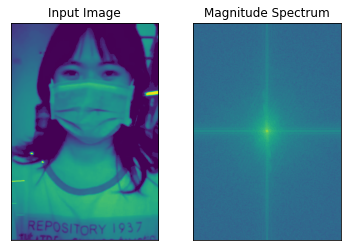

In [10]:
img = cv.imread('fake.png',0)
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20*np.log(np.abs(fshift))
plt.subplot(121),plt.imshow(img)
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum)
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

In [6]:
def get_decoder_ngram_model(tokenizer, ngram_lm_path):
    vocab_dict = tokenizer.get_vocab()
    print(f"vocab dict: {vocab_dict}")
    sort_vocab = sorted((value, key) for (key, value) in vocab_dict.items())
    vocab = [x[1] for x in sort_vocab][:-2]
    vocab_list = vocab
    # convert ctc blank character representation
    vocab_list[tokenizer.pad_token_id] = ""
    # replace special characters
    vocab_list[tokenizer.unk_token_id] = ""
    # vocab_list[tokenizer.bos_token_id] = ""
    # vocab_list[tokenizer.eos_token_id] = ""
    # convert space character representation
    vocab_list[tokenizer.word_delimiter_token_id] = " "
    # specify ctc blank char index, since conventially it is the last entry of the logit matrix
    alphabet = Alphabet.build_alphabet(vocab_list, ctc_token_idx=tokenizer.pad_token_id)
    print(vocab_list)
    lm_model = kenlm.Model(ngram_lm_path)
    decoder = BeamSearchDecoderCTC(alphabet,
                                   language_model=LanguageModel(lm_model))
    return decoder, vocab_list, vocab_dict

In [7]:
ngram_lm_model, emissions, vocab_dict = get_decoder_ngram_model(processor.tokenizer, lm_file)

vocab dict: {'ẻ': 0, '6': 1, 'ụ': 2, 'í': 3, '3': 4, 'ỹ': 5, 'ý': 6, 'ẩ': 7, 'ở': 8, 'ề': 9, 'õ': 10, '7': 11, 'ê': 12, 'ứ': 13, 'ỏ': 14, 'v': 15, 'ỷ': 16, 'a': 17, 'l': 18, 'ự': 19, 'q': 20, 'ờ': 21, 'j': 22, 'ố': 23, 'à': 24, 'ỗ': 25, 'n': 26, 'é': 27, 'ủ': 28, 'у': 29, 'ô': 30, 'u': 31, 'y': 32, 'ằ': 33, '4': 34, 'w': 35, 'b': 36, 'ệ': 37, 'ễ': 38, 's': 39, 'ì': 40, 'ầ': 41, 'ỵ': 42, '8': 43, 'd': 44, 'ể': 45, 'r': 47, 'ũ': 48, 'c': 49, 'ạ': 50, '9': 51, 'ế': 52, 'ù': 53, 'ỡ': 54, '2': 55, 't': 56, 'i': 57, 'g': 58, '́': 59, 'ử': 60, '̀': 61, 'á': 62, '0': 63, 'ậ': 64, 'e': 65, 'ộ': 66, 'm': 67, 'ẳ': 68, 'ợ': 69, 'ĩ': 70, 'h': 71, 'â': 72, 'ú': 73, 'ọ': 74, 'ồ': 75, 'ặ': 76, 'f': 77, 'ữ': 78, 'ắ': 79, 'ỳ': 80, 'x': 81, 'ó': 82, 'ã': 83, 'ổ': 84, 'ị': 85, '̣': 86, 'z': 87, 'ả': 88, 'đ': 89, 'è': 90, 'ừ': 91, 'ò': 92, 'ẵ': 93, '1': 94, 'ơ': 95, 'k': 96, 'ẫ': 97, 'p': 98, 'ấ': 99, 'ẽ': 100, 'ỉ': 101, 'ớ': 102, 'ẹ': 103, 'ă': 104, 'o': 105, 'ư': 106, '5': 107, '|': 46, '<unk>': 108, '<p

## Load audio and infer

In [ ]:
# download test sound file
audio_file = hf_bucket_url("nguyenvulebinh/wav2vec2-base-vietnamese-250h", filename='audio-test/t1_utt000000042.wav')
audio_file = cached_path(audio_file,cache_dir=cache_dir)
os.rename(audio_file, cache_dir+"t1_utt000000042.wav")
audio_file = cache_dir+"t1_utt000000042.wav"

Downloading:   0%|          | 0.00/76.8k [00:00<?, ?B/s]

In [ ]:
# define function to read in sound file
def map_to_array(batch):
    speech, sampling_rate = sf.read(batch["file"])
    batch["speech"] = speech
    batch["sampling_rate"] = sampling_rate
    return batch

# load dummy dataset and read soundfiles
ds = map_to_array({"file": audio_file})

In [11]:
ds = speech_file_to_array_fn('/content/3130303030365f3431.wav')

In [15]:
from pydub import AudioSegment


In [16]:
OriAudio = AudioSegment.from_mp3('/content/3130303030365f3431.wav')
OriAudio
# file_count = 0
# with open(syncmap_file_path, 'r', encoding="utf8") as istr:
#     with open(out_dir+'.txt', 'w', encoding="utf8") as ostr:
#         for line in istr:
#             formatted = line.split()
#             t1 = float(formatted[1]) * 1000 #Works in milliseconds
#             t2 = float(formatted[2]) * 1000
#             newAudio = OriAudio[t1:t2]
#             file_count += 1
#             newAudio.export(out_dir+'_'+ str(file_count).zfill(6) +'.wav', format="wav") #Exports to a wav file in the current path.

In [12]:
# infer model
input_values = processor(
      ds["speech"], 
      sampling_rate=ds["sampling_rate"], 
      return_tensors="pt"
).input_values
# ).input_values.to("cuda")
# model.to("cuda")
logits = vi_model(input_values).logits[0]
print(logits.shape)

torch.Size([499, 110])


In [13]:
import IPython

In [14]:
# decode ctc output
pred_ids = torch.argmax(logits, dim=-1)
greedy_search_output = processor.decode(pred_ids)
beam_search_output = ngram_lm_model.decode(logits.cpu().detach().numpy(), beam_width=500)
print("Greedy search output: {}".format(greedy_search_output))
print("Beam search output: {}".format(beam_search_output))
IPython.display.Audio(filename='/content/3130303030365f3431.wav', autoplay=True)

Greedy search output: m đúng kn sờ san đôi ó kia g là cùa npheo anh bau qá
Beam search output: đúng sannôiókiaglàcùannpheoanhbauquá


In [ ]:
len(greedy_search_output)

36

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
labels = emissions
emission = logits

['ẻ', '6', 'ụ', 'í', '3', 'ỹ', 'ý', 'ẩ', 'ở', 'ề', 'õ', '7', 'ê', 'ứ', 'ỏ', 'v', 'ỷ', 'a', 'l', 'ự', 'q', 'ờ', 'j', 'ố', 'à', 'ỗ', 'n', 'é', 'ủ', 'у', 'ô', 'u', 'y', 'ằ', '4', 'w', 'b', 'ệ', 'ễ', 's', 'ì', 'ầ', 'ỵ', '8', 'd', 'ể', ' ', 'r', 'ũ', 'c', 'ạ', '9', 'ế', 'ù', 'ỡ', '2', 't', 'i', 'g', '́', 'ử', '̀', 'á', '0', 'ậ', 'e', 'ộ', 'm', 'ẳ', 'ợ', 'ĩ', 'h', 'â', 'ú', 'ọ', 'ồ', 'ặ', 'f', 'ữ', 'ắ', 'ỳ', 'x', 'ó', 'ã', 'ổ', 'ị', '̣', 'z', 'ả', 'đ', 'è', 'ừ', 'ò', 'ẵ', '1', 'ơ', 'k', 'ẫ', 'p', 'ấ', 'ẽ', 'ỉ', 'ớ', 'ẹ', 'ă', 'o', 'ư', '5', '', '']


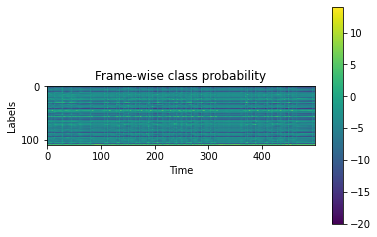

In [ ]:
print(labels)
plt.imshow(emission.detach().numpy().T)
plt.colorbar()
plt.title("Frame-wise class probability")
plt.xlabel("Time")
plt.ylabel("Labels")
plt.show()

In [ ]:
transcript = "những niềm đau khi anh rời xa nhớ đôi môi kia giờ là của ai tiếng gió đông về lòng anh đau quá để rồi đôi ta chia xa gặp nhau như chưa từng quen chuyện yêu đương không còn tha thiết nói lời chia tay chẳng phải lở lời không lòng tin không còn hy vọng còn chuyện ưu tư không dám mở lời đem suy nghĩ và cùng lời ca hòa hợp cùng thả vào trong gió chiều càng hy vọng rồi lại thất vọng để bán niềm vui anh không có nhiều"
dictionary = {c: i for i, c in enumerate(labels)}

tokens = [dictionary[c] for c in transcript]
print(list(zip(transcript, tokens)))


def get_trellis(emission, tokens, blank_id=0):
    num_frame = emission.size(0)
    num_tokens = len(tokens)

    # Trellis has extra diemsions for both time axis and tokens.
    # The extra dim for tokens represents <SoS> (start-of-sentence)
    # The extra dim for time axis is for simplification of the code.
    trellis = torch.empty((num_frame + 1, num_tokens + 1))
    trellis[0, 0] = 0
    trellis[1:, 0] = torch.cumsum(emission[:, 0], 0)
    trellis[0, -num_tokens:] = -float("inf")
    trellis[-num_tokens:, 0] = float("inf")

    for t in range(num_frame):
        trellis[t + 1, 1:] = torch.maximum(
            # Score for staying at the same token
            trellis[t, 1:] + emission[t, blank_id],
            # Score for changing to the next token
            trellis[t, :-1] + emission[t, tokens],
        )
    return trellis


trellis = get_trellis(emission, tokens)

[('n', 26), ('h', 71), ('ữ', 78), ('n', 26), ('g', 58), (' ', 46), ('n', 26), ('i', 57), ('ề', 9), ('m', 67), (' ', 46), ('đ', 89), ('a', 17), ('u', 31), (' ', 46), ('k', 96), ('h', 71), ('i', 57), (' ', 46), ('a', 17), ('n', 26), ('h', 71), (' ', 46), ('r', 47), ('ờ', 21), ('i', 57), (' ', 46), ('x', 81), ('a', 17), (' ', 46), ('n', 26), ('h', 71), ('ớ', 102), (' ', 46), ('đ', 89), ('ô', 30), ('i', 57), (' ', 46), ('m', 67), ('ô', 30), ('i', 57), (' ', 46), ('k', 96), ('i', 57), ('a', 17), (' ', 46), ('g', 58), ('i', 57), ('ờ', 21), (' ', 46), ('l', 18), ('à', 24), (' ', 46), ('c', 49), ('ủ', 28), ('a', 17), (' ', 46), ('a', 17), ('i', 57), (' ', 46), ('t', 56), ('i', 57), ('ế', 52), ('n', 26), ('g', 58), (' ', 46), ('g', 58), ('i', 57), ('ó', 82), (' ', 46), ('đ', 89), ('ô', 30), ('n', 26), ('g', 58), (' ', 46), ('v', 15), ('ề', 9), (' ', 46), ('l', 18), ('ò', 92), ('n', 26), ('g', 58), (' ', 46), ('a', 17), ('n', 26), ('h', 71), (' ', 46), ('đ', 89), ('a', 17), ('u', 31), (' ', 46),

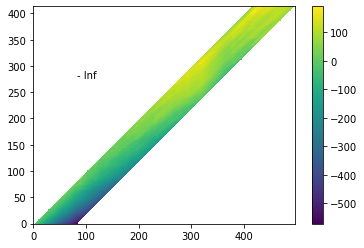

In [ ]:
plt.imshow(trellis[1:, 1:].detach().numpy().T, origin="lower")
plt.annotate("- Inf", (trellis.size(1) / 5, trellis.size(1) / 1.5))
plt.colorbar()
plt.show()

In [ ]:
from dataclasses import dataclass

In [ ]:
@dataclass
class Point:
    token_index: int
    time_index: int
    score: float


def backtrack(trellis, emission, tokens, blank_id=0):
    # Note:
    # j and t are indices for trellis, which has extra dimensions
    # for time and tokens at the beginning.
    # When referring to time frame index `T` in trellis,
    # the corresponding index in emission is `T-1`.
    # Similarly, when referring to token index `J` in trellis,
    # the corresponding index in transcript is `J-1`.
    j = trellis.size(1) - 1
    t_start = torch.argmax(trellis[:, j]).item()

    path = []
    for t in range(t_start, 0, -1):
        # 1. Figure out if the current position was stay or change
        # Note (again):
        # `emission[J-1]` is the emission at time frame `J` of trellis dimension.
        # Score for token staying the same from time frame J-1 to T.
        stayed = trellis[t - 1, j] + emission[t - 1, blank_id]
        # Score for token changing from C-1 at T-1 to J at T.
        changed = trellis[t - 1, j - 1] + emission[t - 1, tokens[j - 1]]

        # 2. Store the path with frame-wise probability.
        prob = emission[t - 1, tokens[j - 1] if changed > stayed else 0].exp().item()
        # Return token index and time index in non-trellis coordinate.
        path.append(Point(j - 1, t - 1, prob))

        # 3. Update the token
        if changed > stayed:
            j -= 1
            if j == 0:
                break
    else:
        raise ValueError("Failed to align")
    return path[::-1]


path = backtrack(trellis, emission, tokens)
for p in path:
    print(p)

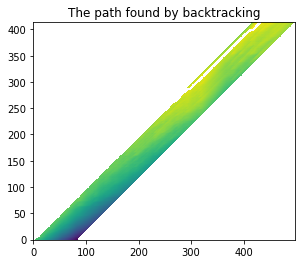

In [ ]:
def plot_trellis_with_path(trellis, path):
    # To plot trellis with path, we take advantage of 'nan' value
    trellis_with_path = trellis.clone()
    for _, p in enumerate(path):
        trellis_with_path[p.time_index, p.token_index] = float("nan")
    plt.imshow(trellis_with_path[1:, 1:].detach().numpy().T, origin="lower")


plot_trellis_with_path(trellis, path)
plt.title("The path found by backtracking")
plt.show()

In [ ]:
# Merge the labels
@dataclass
class Segment:
    label: str
    start: int
    end: int
    score: float

    def __repr__(self):
        return f"{self.label}\t({self.score:4.2f}): [{self.start:5d}, {self.end:5d})"

    @property
    def length(self):
        return self.end - self.start


def merge_repeats(path):
    i1, i2 = 0, 0
    segments = []
    while i1 < len(path):
        while i2 < len(path) and path[i1].token_index == path[i2].token_index:
            i2 += 1
        score = sum(path[k].score for k in range(i1, i2)) / (i2 - i1)
        segments.append(
            Segment(
                transcript[path[i1].token_index],
                path[i1].time_index,
                path[i2 - 1].time_index + 1,
                score,
            )
        )
        i1 = i2
    return segments


segments = merge_repeats(path)
for seg in segments:
    print(seg)

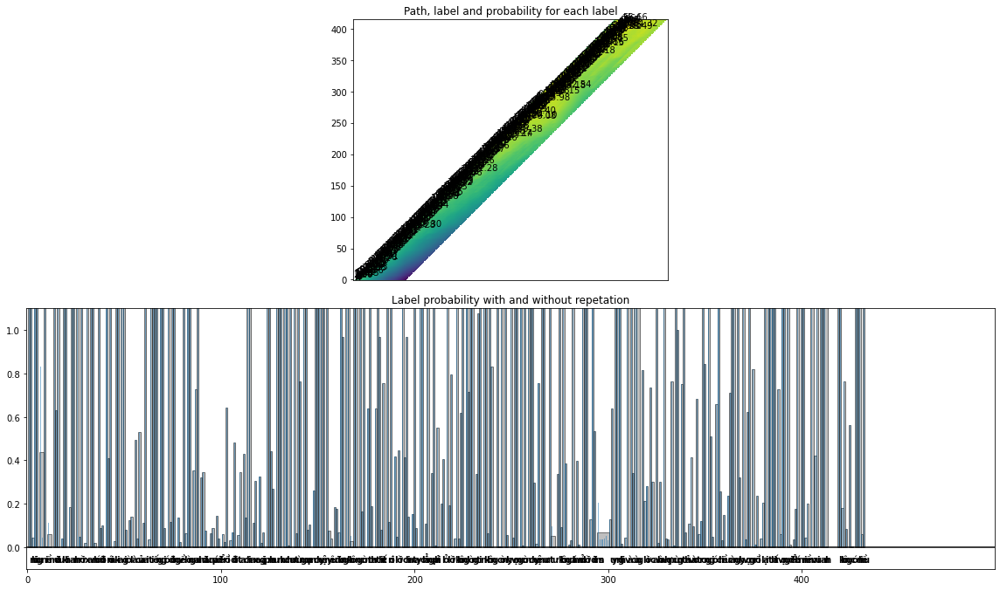

In [ ]:
def plot_trellis_with_segments(trellis, segments, transcript):
    # To plot trellis with path, we take advantage of 'nan' value
    trellis_with_path = trellis.clone()
    for i, seg in enumerate(segments):
        if seg.label != " ":
            trellis_with_path[seg.start + 1 : seg.end + 1, i + 1] = float("nan")

    fig, [ax1, ax2] = plt.subplots(2, 1, figsize=(16, 9.5))
    ax1.set_title("Path, label and probability for each label")
    ax1.imshow(trellis_with_path.detach().numpy().T, origin="lower")
    ax1.set_xticks([])

    for i, seg in enumerate(segments):
        if seg.label != " ":
            ax1.annotate(seg.label, (seg.start + 0.7, i + 0.3), weight="bold")
            ax1.annotate(f"{seg.score:.2f}", (seg.start - 0.3, i + 4.3))

    ax2.set_title("Label probability with and without repetation")
    xs, hs, ws = [], [], []
    for seg in segments:
        if seg.label != " ":
            xs.append((seg.end + seg.start) / 2 + 0.4)
            hs.append(seg.score)
            ws.append(seg.end - seg.start)
            ax2.annotate(seg.label, (seg.start + 0.8, -0.07), weight="bold")
    ax2.bar(xs, hs, width=ws, color="gray", alpha=0.5, edgecolor="black")

    xs, hs = [], []
    for p in path:
        label = transcript[p.token_index]
        if label != " ":
            xs.append(p.time_index + 1)
            hs.append(p.score)

    ax2.bar(xs, hs, width=0.5, alpha=0.5)
    ax2.axhline(0, color="black")
    ax2.set_xlim(ax1.get_xlim())
    ax2.set_ylim(-0.1, 1.1)


plot_trellis_with_segments(trellis, segments, transcript)
plt.tight_layout()
plt.show()

In [ ]:
# Merge words
def merge_words(segments, separator=" "):
    words = []
    i1, i2 = 0, 0
    while i1 < len(segments):
        if i2 >= len(segments) or segments[i2].label == separator:
            if i1 != i2:
                segs = segments[i1:i2]
                word = "".join([seg.label for seg in segs])
                score = sum(seg.score * seg.length for seg in segs) / sum(seg.length for seg in segs)
                words.append(Segment(word, segments[i1].start, segments[i2 - 1].end, score))
            i1 = i2 + 1
            i2 = i1
        else:
            i2 += 1
    return words


word_segments = merge_words(segments)
for word in word_segments:
    print(word)

In [ ]:
waveform, _ = torchaudio.load('/content/3130303030365f3431.wav')

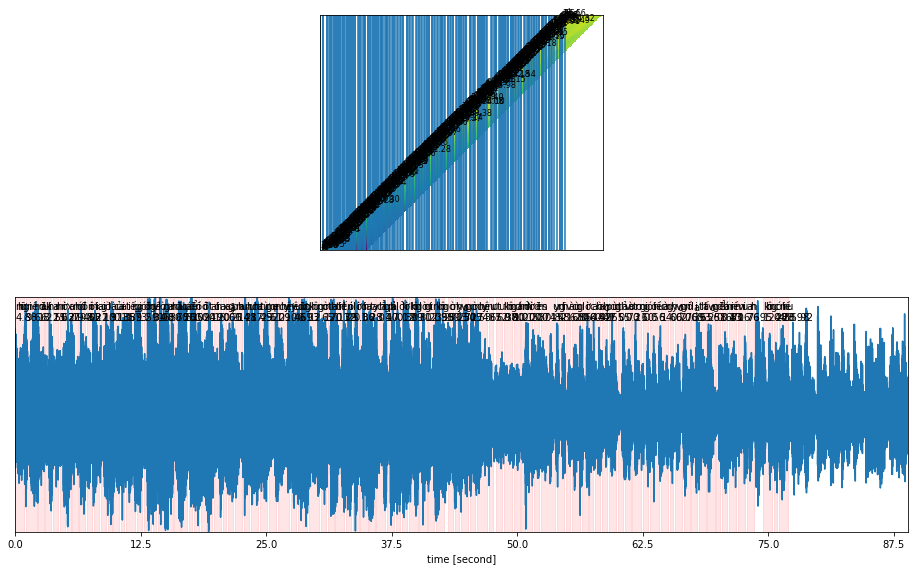

In [ ]:
def plot_alignments(trellis, segments, word_segments, waveform):
    trellis_with_path = trellis.clone()
    for i, seg in enumerate(segments):
        if seg.label != " ":
            trellis_with_path[seg.start + 1 : seg.end + 1, i + 1] = float("nan")

    fig, [ax1, ax2] = plt.subplots(2, 1, figsize=(16, 9.5))

    ax1.imshow(trellis_with_path[1:, 1:].detach().numpy().T, origin="lower")
    ax1.set_xticks([])
    ax1.set_yticks([])

    for word in word_segments:
        ax1.axvline(word.start - 0.5)
        ax1.axvline(word.end - 0.5)

    for i, seg in enumerate(segments):
        if seg.label != " ":
            ax1.annotate(seg.label, (seg.start, i + 0.3))
            ax1.annotate(f"{seg.score:.2f}", (seg.start, i + 4), fontsize=8)

    # The original waveform
    ratio = waveform.size(0) / (trellis.size(0) - 1)
    ax2.plot(waveform)
    for word in word_segments:
        x0 = ratio * word.start
        x1 = ratio * word.end
        ax2.axvspan(x0, x1, alpha=0.1, color="red")
        ax2.annotate(f"{word.score:.2f}", (x0, 0.8))

    for seg in segments:
        if seg.label != " ":
            ax2.annotate(seg.label, (seg.start * ratio, 0.9))
    xticks = ax2.get_xticks()
    plt.xticks(xticks, xticks / ds["sampling_rate"])
    ax2.set_xlabel("time [second]")
    ax2.set_yticks([])
    ax2.set_ylim(-1.0, 1.0)
    ax2.set_xlim(0, waveform.size(-1))


plot_alignments(
    trellis,
    segments,
    word_segments,
    waveform[0],
)
plt.show()

In [ ]:
# A trick to embed the resulting audio to the generated file.
# `IPython.display.Audio` has to be the last call in a cell,
# and there should be only one call par cell.
sp = ds["sampling_rate"]
def display_segment(i):
    ratio = waveform.size(1) / (trellis.size(0) - 1)
    word = word_segments[i]
    x0 = int(ratio * word.start)
    x1 = int(ratio * word.end)
    print(f"{word.label} ({word.score:.2f}): {x0 / sp:.3f} - {x1 / sp:.3f} sec")
    segment = waveform[:, x0:x1]
    return IPython.display.Audio(segment.numpy(), rate=sp)

In [ ]:
len(waveform)

1

In [ ]:
import scipy
from scipy.io import wavfile
  
# function to convert the information into 
# some readable format
def output_duration(length):
    hours = length // 3600  # calculate in hours
    length %= 3600
    mins = length // 60  # calculate in minutes
    length %= 60
    seconds = length  # calculate in seconds
  
    return hours, mins, seconds
  
# sample_rate holds the sample rate of the wav file
# in (sample/sec) format
# data is the numpy array that consists
# of actual data read from the wav file
sample_rate, data = wavfile.read('/content/3130303030365f3431.wav')
  
len_data = len(data)  # holds length of the numpy array
  
t = len_data / sample_rate  # returns duration but in floats
  
hours, mins, seconds = output_duration(int(t))
print('Total Duration: {}:{}:{}'.format(hours, mins, seconds))

Total Duration: 0:0:29


In [ ]:
# Generate the audio for each segment
print(transcript)
IPython.display.Audio('/content/38313537315f3832.wav')

và cô đơn vẫn gọi tên anh đằng sau là những chuỗi ngày dài quan tâm làm chi ngày mai


In [ ]:
import json
import multidict

In [ ]:
import numpy as np

In [ ]:
!unzip -u "/content/drive/MyDrive/ColabNotebooks/public_test.zip" -d "/content/"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
with open('/content/public_test/lyrics/3130303030365f3431.txt') as f:
    contents = f.readlines()
    print(contents)

['Những niềm đau khi anh rời xa Nhớ đôi môi kia giờ là của ai Tiếng gió đông về lòng anh đau quá Để rồi đôi ta chia xa Gặp nhau như chưa từng quen Chuyện yêu đương không còn tha thiết Nói lời chia tay chẳng phải lở lời Không lòng tin không còn hy vọng Còn chuyện ưu tư không dám mở lời Đem suy nghĩ và cùng lời ca Hòa hợp cùng thả vào trong gió chiều Càng hy vọng rồi lại thất vọng Để bán niềm vui anh không có nhiều']


In [ ]:
contents[0].lower()

'những niềm đau khi anh rời xa nhớ đôi môi kia giờ là của ai tiếng gió đông về lòng anh đau quá để rồi đôi ta chia xa gặp nhau như chưa từng quen chuyện yêu đương không còn tha thiết nói lời chia tay chẳng phải lở lời không lòng tin không còn hy vọng còn chuyện ưu tư không dám mở lời đem suy nghĩ và cùng lời ca hòa hợp cùng thả vào trong gió chiều càng hy vọng rồi lại thất vọng để bán niềm vui anh không có nhiều'

In [ ]:
import os

In [ ]:
original_text = []
lower_text = []
id_wav_file = []

folder_path = "/content/public_test/lyrics"

for fl in os.listdir(folder_path):
  fl_path = os.path.join(folder_path, fl)

  with open(fl_path) as f:
    contents = f.readlines()
    original_text.append(contents)
    lower_text.append(contents[0].lower())
  
  id = fl[:-3] + "wav"
  id_wav_file.append(id)

In [ ]:
wav_folder = "/content/public_test/songs"

In [ ]:
for i in range(len(lower_text)):
  wav_path = os.path.join(wav_folder, id_wav_file[i])

  ds = speech_file_to_array_fn(wav_path)

  # infer model
  input_values = processor(
        ds["speech"], 
        sampling_rate=ds["sampling_rate"], 
        return_tensors="pt"
  ).input_values
  # ).input_values.to("cuda")
  # model.to("cuda")
  logits = vi_model(input_values).logits[0]
  print(logits.shape)

  emission = logits

  transcript = lower_text[i]
  #dictionary = {c: i for i, c in enumerate(labels)}

  tokens = [dictionary[c] for c in transcript]

  trellis = get_trellis(emission, tokens)

  path = backtrack(trellis, emission, tokens)
  segments = merge_repeats(path)
  word_segments = merge_words(segments)
  waveform, _ = torchaudio.load(wav_path)

  sample_rate, data = wavfile.read(wav_path)
    
  len_data = len(data)  # holds length of the numpy array
    
  t = len_data / sample_rate  # returns duration but in floats
    
  hours, mins, seconds = output_duration(int(t))

  sp = ds["sampling_rate"]
  ratio = waveform.size(1) / (trellis.size(0) - 1)

  dict_sentence = defaultdict(dict)
  dict_file = defaultdict(dict) 
  segment_count = 0

  dict_sentence["s"] = int(ratio*word_segments[0].start) / sp
  dict_sentence["e"] = int(ratio*word_segments[-1].end) / sp

  word_count = 0

  for word in word_segments:
    
    dict_word = {}

    x0 = int(ratio * word.start)
    x1 = int(ratio * word.end)
    print(f"{word.label} ({word.score:.2f}): {x0 / sp:.3f} - {x1 / sp:.3f} sec")

    dict_word["s"] = x0 / sp
    dict_word["d"] = word.label
    dict_word["e"] = x1 / sp

    dict_sentence[word_count] = dict_word
    word_count += 1

  dict_sentence["t"] = seconds

  dict_file[segment_count] = dict_sentence



In [ ]:
from collections import defaultdict

sp = ds["sampling_rate"]
ratio = waveform.size(1) / (trellis.size(0) - 1)

dict_sentence = defaultdict(dict)
dict_file = defaultdict(dict) 
segment_count = 0

dict_sentence["s"] = int(ratio*word_segments[0].start) / sp
dict_sentence["e"] = int(ratio*word_segments[-1].end) / sp

word_count = 0

for word in word_segments:
  
  dict_word = {}

  x0 = int(ratio * word.start)
  x1 = int(ratio * word.end)
  print(f"{word.label} ({word.score:.2f}): {x0 / sp:.3f} - {x1 / sp:.3f} sec")

  dict_word["s"] = x0 / sp
  dict_word["d"] = word.label
  dict_word["e"] = x1 / sp

  dict_sentence[word_count] = dict_word
  word_count += 1

dict_sentence["t"] = seconds

dict_file[segment_count] = dict_sentence

segment_count += 1

json_object = json.dumps(dict_file, indent = 4, ensure_ascii = False) 
print(json_object)
with open('json_1.json', 'wb') as f:
  np.save(f, json_object)

In [ ]:
files=['json_1.json','files.json',...,'name.json']

def merge_JsonFiles(filename):
    result = list()
    for f1 in filename:
        with open(f1, 'r') as infile:
            result.extend(json.load(infile))

    with open('counseling3.json', 'w') as output_file:
        json.dump(result, output_file)

merge_JsonFiles(files)

{
    "id": "04",
    "name": "sunil",
    "department": "HR"
}


In [ ]:
display_segment(0)

và (6.40): 0.000 - 0.166 sec


In [ ]:
display_segment(1)

cô (0.53): 0.606 - 0.808 sec


In [ ]:
display_segment(2)

đơn (0.43): 0.909 - 1.212 sec


In [ ]:
display_segment(3)

lặng (38940.09): 1.313 - 1.818 sec


In [ ]:
display_segment(4)

lẽ (1.01): 1.919 - 2.121 sec


In [ ]:
display_segment(5)

nhớ (0.62): 2.222 - 2.525 sec


In [ ]:
display_segment(6)

ai (0.54): 2.626 - 2.828 sec


In [ ]:
display_segment(7)

bệnh (382497.50): 1.976 - 2.118 sec
